From Andrew:

Here is working code to plot our derived method. Please keep this block of code in tact, copy and paste to another cell to play around with it and see what happens.

The only things that are worth changing are:

In parameters:
1.   n (the number of spacial steps): more = smoother curve
2.   c (the wave speed): higher = faster propogation
3.   dt (time step): smaller = smoother propogation, more computation time
4.   F0 (forcing amplitude): larger = higher peaks

In initial conditions:
1.   u0 (initial height): change the initial profile of the curve
2.   v0 (initial velovity): can specify this now due to second time derivative, probably best kept at zero

In Store 7 equally spaced time steps:
1.   g = F_0 * np.sin(2 * np.pi * x) * np.cos(2 * np.pi * step * dt): you can change this g to be whatever forcing function we are looking to evaluate. if we set this at 0, we can explore the no forcing case and then probably compare to an analytical solution to test if our method works (which it should). then we can set it to something funky like this which shows unique behavior that can answer a question we have yet to write

In plot colors:
1.   colors = plt.cm.______ : change the blank to any python color library you think is cool, rainbow, virdis, magma/plasma/inferno, etc.)
2. linspace(x, y, z) : x starting value 0<x<1, y = ending value x<y<1, z = number of steps to take to spread out color, higher = more similar colors








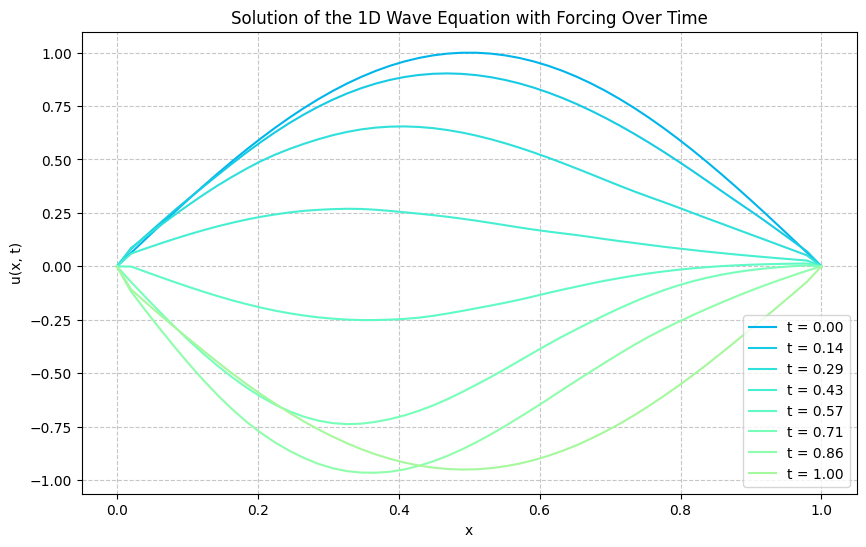

In [ ]:
# Re-import libraries and re-run the script due to state reset
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import diags
from scipy.sparse.linalg import spsolve, inv
from scipy.sparse import csr_matrix
from scipy import signal

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, 16))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Parameters
a, b = 0, 1
n = 50  # number of spatial steps
c = 1   # wave speed
dx = (b - a) / (n - 1)
dt = 0.0025  # Smaller time step to capture detail
x = np.linspace(a, b, n)
t_max = 1.0
timesteps = int(t_max / dt)
F_0 = 5  # Amplitude of the forcing function

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Dirichlet boundary conditions
u0[0], u0[-1] = 0, 0

# Finite difference matrix (tridiagonal for spatial Laplacian)
main_diag = -2 * np.ones(n)
off_diag = np.ones(n - 1)
A = diags([off_diag, main_diag, off_diag], [-1, 0, 1]) / dx**2
A = c**2 * A

# Convert A to CSR for sparse operations
A = csr_matrix(A)

# Initial state vector (concatenated displacement and velocity)
U = np.concatenate([u0, v0])

# Identity and zero matrices for block construction
I = np.eye(n)
Z = np.zeros((n, n))

# Crank-Nicolson block matrices
Block_A = np.block([[Z, I], [A.toarray(), Z]])
M1 = np.eye(2 * n) - 0.5 * dt * Block_A
M2 = np.eye(2 * n) + 0.5 * dt * Block_A

# Convert M1 to CSR format to avoid warnings
M1 = csr_matrix(M1)

# Store 7 equally spaced time steps
U_solutions = []
for step in range(timesteps):
    # Define the forcing term as a sinusoidal driver
    g = F_0 * np.sin(2 * np.pi * x) * np.cos(2 * np.pi * step * dt)

    # Concatenate forcing into the full state vector format
    forcing = np.concatenate([np.zeros(n), g])

    # Right-hand side of the equation with forcing term
    rhs = M2 @ U + dt * forcing

    # Solve the implicit system
    U = spsolve(M1, rhs)

    # Apply Dirichlet BCs explicitly to displacement
    U[0], U[n-1] = 0, 0

    # Store the solution at 7 distinct time intervals
    if step % int(timesteps / 7) == 0:
        U_solutions.append(U[:n].copy())

# Plot the solutions at 7 distinct time intervals
time_points = np.linspace(0, t_max, len(U_solutions))
plt.figure(figsize=(10, 6))
for idx, u_sol in enumerate(U_solutions):
    plt.plot(x, u_sol, label=f't = {time_points[idx]:.2f}')
plt.title("Solution of the 1D Wave Equation with Forcing Over Time")
plt.xlabel("x")
plt.ylabel("u(x, t)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

Also from Andrew:

Run this animation cell right after you run the above code to actually watch and see how the wave evolves, the current forcing function actually looks really cool. Once again, probably best to copy and paste to make sure that you don't accidentally mess up the code.

Things to change:

Literally only t_max to get desired duration of the animation, the g = F_0... in the forcing term to match what you chose, and then the file name in ani.save (last line) to save the file.


Note: its kinda funky at endpoints but whatever its close enough

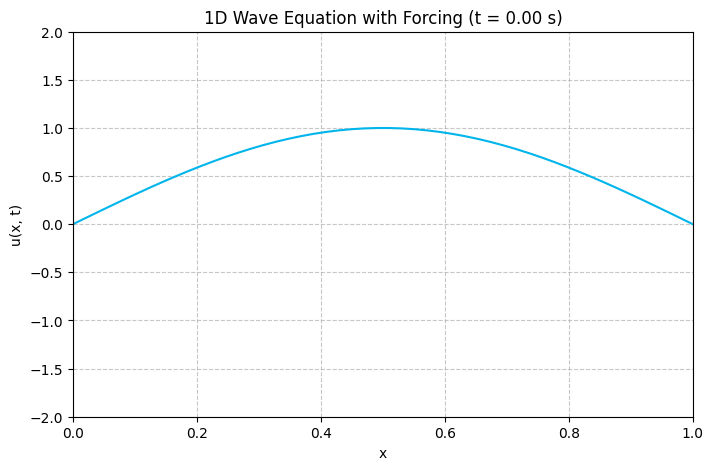

In [ ]:
# Animation of the wave propagation with forcing over 2 seconds
import matplotlib.animation as animation

# Extend the time for 2 seconds
t_max = 2.0
timesteps = int(t_max / dt)

# Re-initialize the solution and the state vector
U = np.concatenate([u0, v0])
U_solutions = []

# Store all time steps for animation
for step in range(timesteps):
    # Define the forcing term as a sinusoidal driver
    g = F_0 * np.sin(2 * np.pi * x) * np.cos(2 * np.pi * step * dt)

    # Concatenate forcing into the full state vector format
    forcing = np.concatenate([np.zeros(n), g])

    # Right-hand side of the equation with forcing term
    rhs = M2 @ U + dt * forcing

    # Solve the implicit system
    U = spsolve(M1, rhs)

    # Apply Dirichlet BCs explicitly to displacement
    U[0], U[n-1] = 0, 0

    # Store each time step for the animation
    U_solutions.append(U[:n].copy())

# Plot settings for animation
fig, ax = plt.subplots(figsize=(8, 5))
line, = ax.plot(x, U_solutions[0])
ax.set_xlim(0, 1)
ax.set_ylim(-2, 2)
ax.set_title("1D Wave Equation Propagation with Forcing Over 2 Seconds")
ax.set_xlabel("x")
ax.set_ylabel("u(x, t)")
plt.grid(True, linestyle='--', alpha=0.7)

# Update function for animation
def update(frame):
    line.set_ydata(U_solutions[frame])
    ax.set_title(f"1D Wave Equation with Forcing (t = {frame * dt:.2f} s)")
    return line,

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=len(U_solutions), blit=True, interval=30)

# Display the animation
plt.show()

# Save the animation as a GIF
ani.save('1D_Wave_Equation_Propagation_2s.gif', writer='pillow', fps=30)

To save the animation to your downloads run this cell

In [ ]:
from google.colab import files
files.download('1D_Wave_Equation_Propagation_2s.gif')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

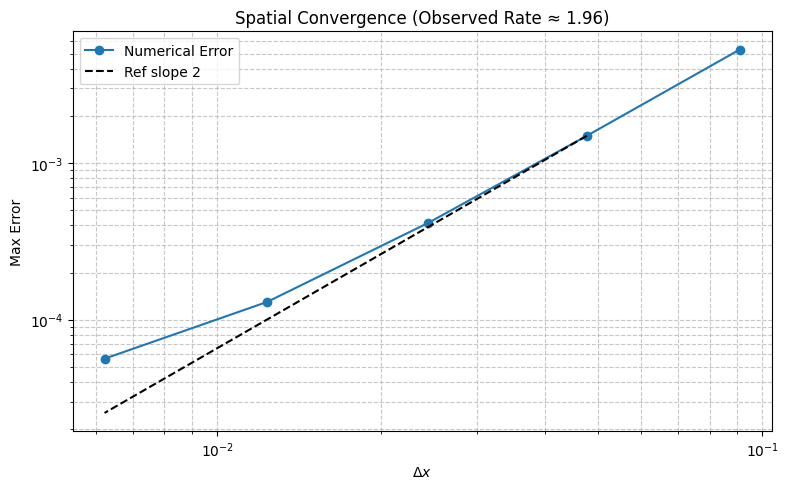

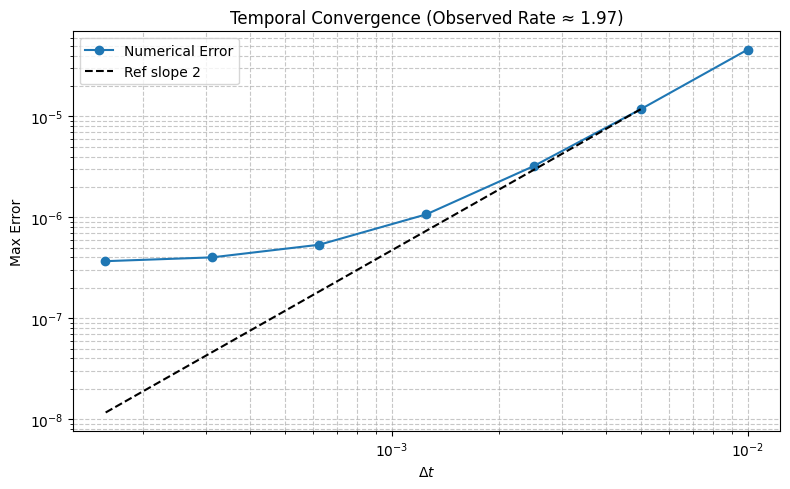

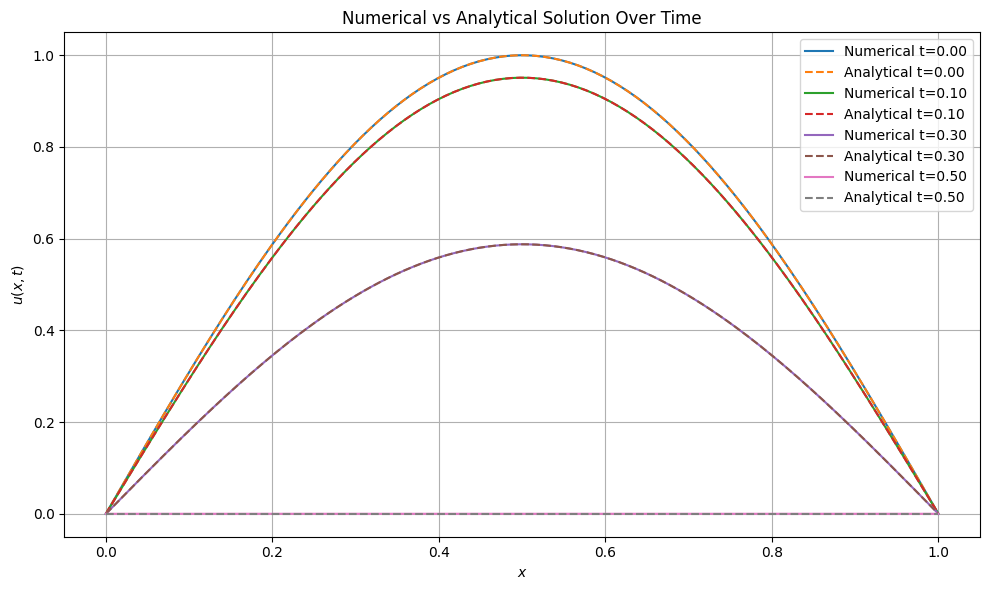

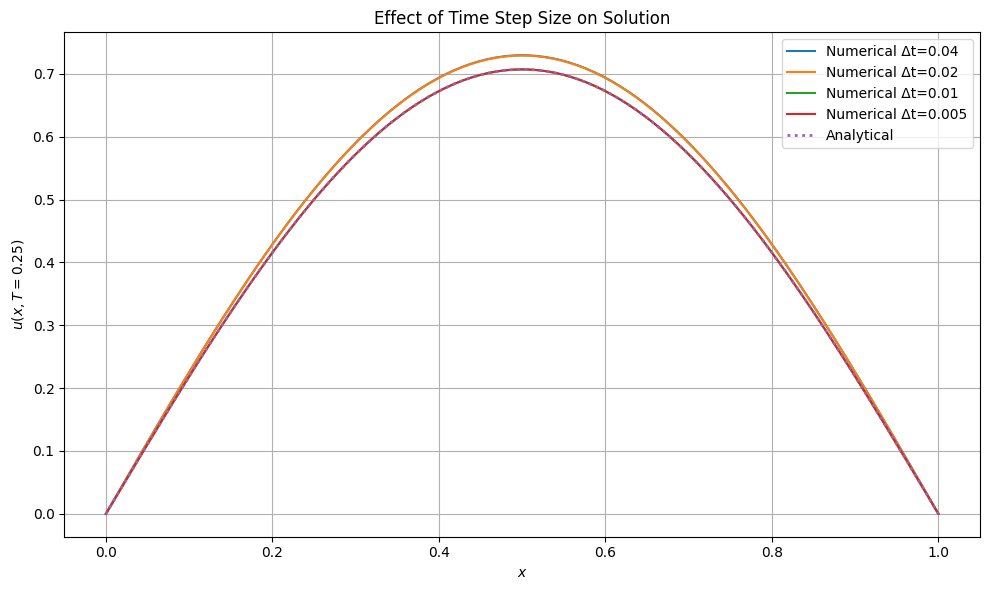

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import diags, eye, bmat
from scipy.sparse.linalg import spsolve

# --- Analytical solution ---
def u_analytical(x, t, c=1.0):
    return np.sin(np.pi * x) * np.cos(np.pi * c * t)

# --- Crank-Nicolson solver ---
def crank_nicolson_sparse(N, dt, T=0.5, c=1.0):
    dx = 1 / (N + 1)
    x = np.linspace(0, 1, N + 2)
    Nt = int(T / dt)

    u0 = np.sin(np.pi * x)[1:-1]
    v0 = np.zeros(N)
    D = (c**2 / dx**2) * diags([[1]*(N-1), [-2]*N, [1]*(N-1)], [-1, 0, 1], format="csr")
    Z, I = diags([0]*N, 0, format="csr"), eye(N, format="csr")
    A = bmat([[Z, I], [D, Z]], format="csr")
    I2N = eye(2*N, format="csr")

    M1, M2 = I2N - 0.5 * dt * A, I2N + 0.5 * dt * A
    U = np.concatenate((u0, v0))

    for _ in range(Nt):
        U = spsolve(M1, M2 @ U)

    return x, np.concatenate(([0], U[:N], [0]))

# --- Convergence utilities ---
def compute_convergence_rates(h_vals, errors):
    return [np.log(errors[i] / errors[i - 1]) / np.log(h_vals[i] / h_vals[i - 1]) for i in range(1, len(errors))]

def plot_with_convergence_rate(x_vals, errors, xlabel, title, slope_ref=2):
    plt.figure(figsize=(8, 5))
    plt.loglog(x_vals, errors, 'o-', label='Numerical Error')
    ref_x = np.array([x_vals[1], x_vals[-1]])
    ref_y = errors[1] * (ref_x / x_vals[1])**slope_ref
    plt.loglog(ref_x, ref_y, 'k--', label=f'Ref slope {slope_ref}')
    rate = np.log(errors[1]/errors[0]) / np.log(x_vals[1]/x_vals[0])
    plt.xlabel(xlabel)
    plt.ylabel('Max Error')
    plt.title(f'{title} (Observed Rate ≈ {rate:.2f})')
    plt.grid(True, which='both', linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

# --- Spatial convergence ---
def compute_spatial_convergence(dt=1e-5, t_final=0.5, N_vals=None):
    if N_vals is None:
        N_vals = [10, 20, 40, 80, 160]
    errors = []
    for N in N_vals:
        x, u_num = crank_nicolson_sparse(N=N, dt=dt, T=t_final)
        u_exact = u_analytical(x, t_final)
        errors.append(np.max(np.abs(u_num - u_exact)))
    dx_vals = [1 / (N + 1) for N in N_vals]
    return dx_vals, errors

# --- Temporal convergence ---
def compute_temporal_convergence(N=800, t_final=0.25, dt_vals=None):
    if dt_vals is None:
        dt_vals = [1e-2, 5e-3, 2.5e-3, 1.25e-3, 6.25e-4, 3.125e-4, 1.5625e-4]
    errors = []
    for dt in dt_vals:
        x, u_num = crank_nicolson_sparse(N=N, dt=dt, T=t_final)
        u_exact = u_analytical(x, t_final)
        errors.append(np.max(np.abs(u_num - u_exact)))
    return dt_vals, errors

# --- Multi-time comparison ---
def plot_multi_time_comparison():
    N, dt = 200, 6.25e-4
    T_vals = [0.0, 0.1, 0.3, 0.5]
    dx = 1 / (N + 1)
    x = np.linspace(0, 1, N + 2)

    D = (1.0 / dx**2) * diags([[1]*(N-1), [-2]*N, [1]*(N-1)], [-1, 0, 1], format="csr")
    Z, I = diags([0]*N, 0, format="csr"), eye(N, format="csr")
    A = bmat([[Z, I], [D, Z]], format="csr")
    I2N = eye(2*N, format="csr")

    M1, M2 = I2N - 0.5 * dt * A, I2N + 0.5 * dt * A
    U = np.concatenate((np.sin(np.pi * x)[1:-1], np.zeros(N)))

    snapshots = {}
    for n in range(int(max(T_vals) / dt) + 1):
        t = n * dt
        if any(np.isclose(t, T_vals, atol=1e-6)):
            snapshots[round(t, 4)] = np.concatenate(([0], U[:N], [0]))
        U = spsolve(M1, M2 @ U)

    plt.figure(figsize=(10, 6))
    for t, u_num in snapshots.items():
        plt.plot(x, u_num, label=f'Numerical t={t:.2f}')
        plt.plot(x, u_analytical(x, t), '--', label=f'Analytical t={t:.2f}')
    plt.xlabel('$x$')
    plt.ylabel('$u(x,t)$')
    plt.title('Numerical vs Analytical Solution Over Time')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- Time step effect ---
def plot_effect_of_dt():
    N = 200
    dt_vals = [0.04, 0.02, 0.01, 0.005]
    T = 0.25
    x = np.linspace(0, 1, N + 2)
    plt.figure(figsize=(10, 6))
    for dt in dt_vals:
        x_sim, u_num = crank_nicolson_sparse(N=N, dt=dt, T=T)
        plt.plot(x_sim, u_num, label=f'Numerical Δt={dt}')
    plt.plot(x, u_analytical(x, T), ':', linewidth=2, label='Analytical')
    plt.xlabel('$x$')
    plt.ylabel('$u(x,T=0.25)$')
    plt.title('Effect of Time Step Size on Solution')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === Run All Plots ===

# 1. Spatial convergence
dx_vals, spatial_errors = compute_spatial_convergence()
plot_with_convergence_rate(dx_vals, spatial_errors, r'$\Delta x$', 'Spatial Convergence')

# 2. Temporal convergence
dt_vals, temporal_errors = compute_temporal_convergence()
plot_with_convergence_rate(dt_vals, temporal_errors, r'$\Delta t$', 'Temporal Convergence')

# 3. Multi-time snapshots
plot_multi_time_comparison()

# 4. Time step effect on fixed solution
plot_effect_of_dt()


In [ ]:
# Create different forcing functions
def sinusoidal_driver(step):
   return F_0 * np.sin(2 * np.pi * x) * np.cos(2 * np.pi * step * dt)

def constant_driver(step):
  const_force = np.ones_like(x)
  return F_0 * const_force

def damped_sinusoidal_driver(F_0, step):
  return F_0 * np.exp(-x) * np.sin(2 * np.pi * step * dt)

def gaussian_pulse_driver(F_0, step, t0=0.5, sigma=0.1):
  return (F_0**0.5) * signal.unit_impulse(len(x), idx='mid') * np.exp(-(((step * dt) - t0)**2) / (2 * sigma**2))

def impulse_driver(F_0, step):
  if step == 0:
    return F_0 * signal.unit_impulse(len(x), idx='mid')
  else:
    return np.zeros_like(x)

### The below code will graph the results for the impulse, gaussian, and damped sinudoid.

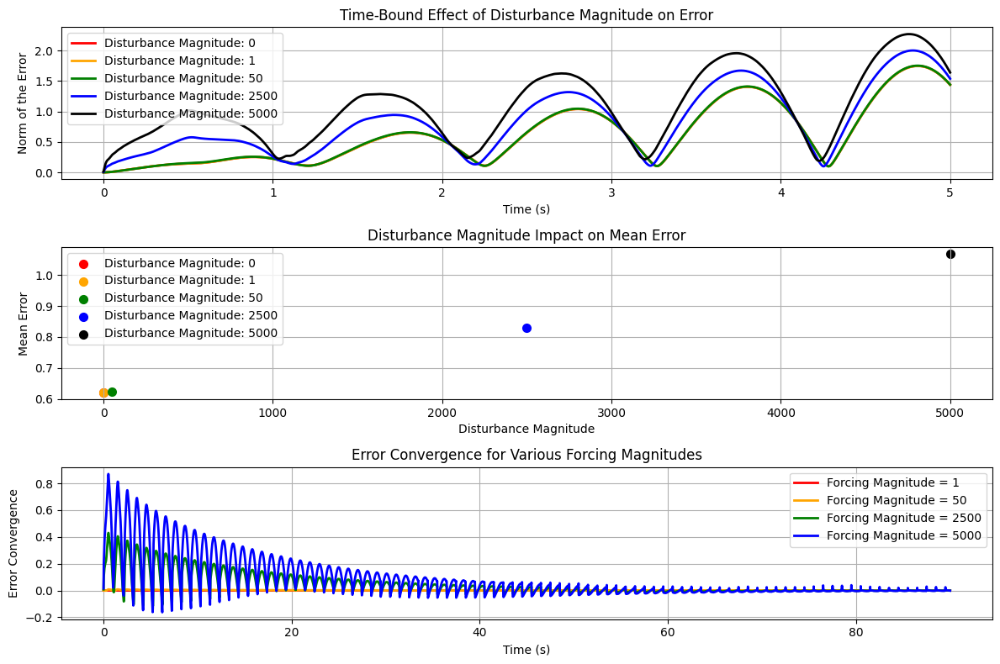

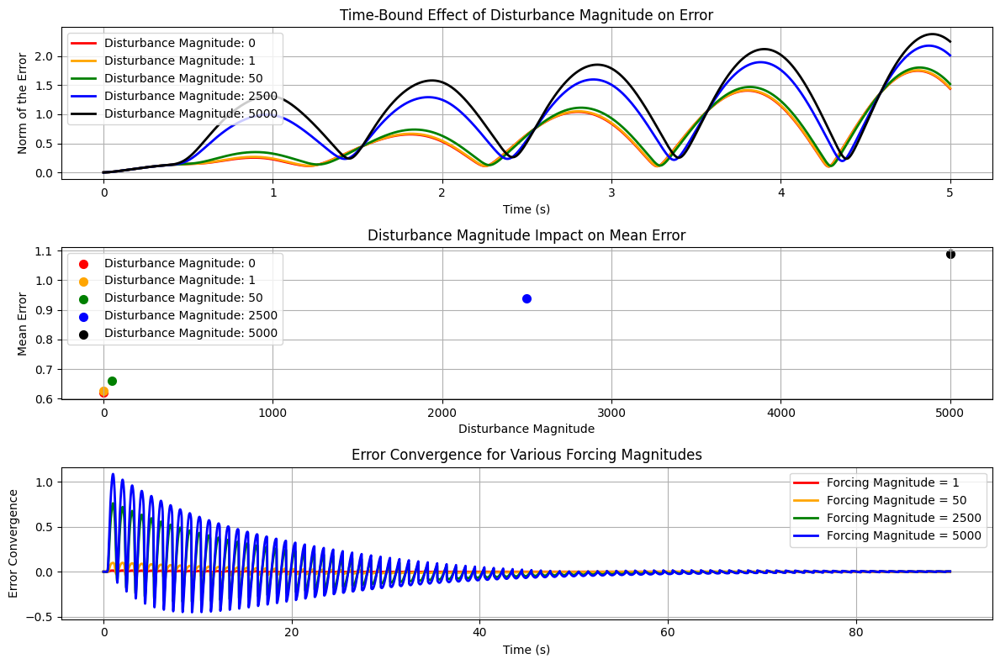

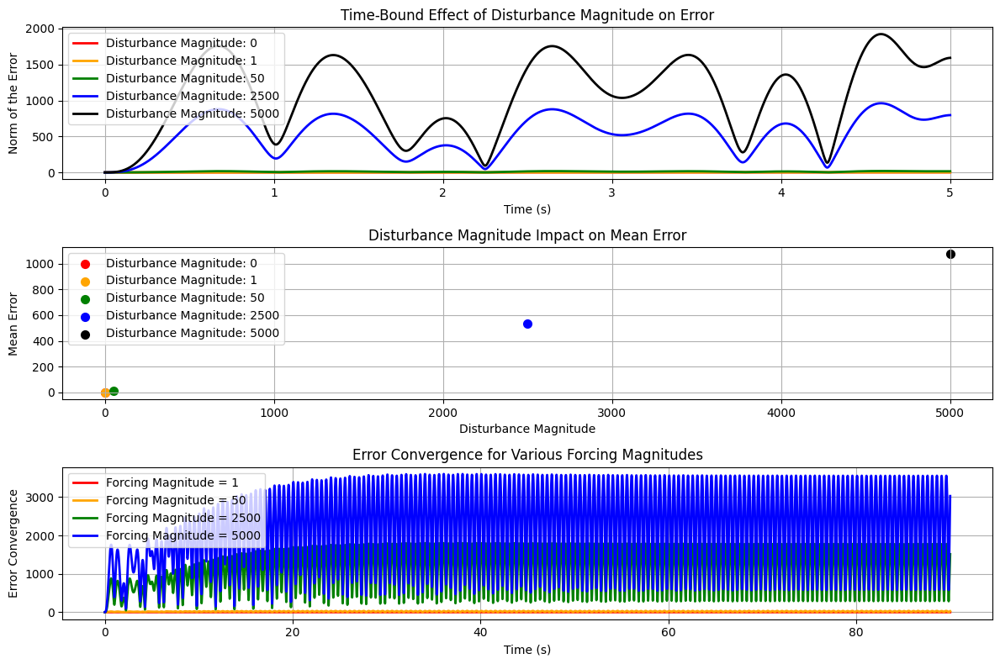

In [ ]:
# Parameters
a, b = 0, 1
n = 50  # number of spatial steps
c = 1   # wave speed
dx = (b - a) / (n - 1)
dt = 0.0025  # Smaller time step to capture detail
x = np.linspace(a, b, n)
t_max = 1.0
timesteps = int(t_max / dt)
F_0 = 5  # Amplitude of the forcing function

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Dirichlet boundary conditions
u0[0], u0[-1] = 0, 0

# Finite difference matrix (tridiagonal for spatial Laplacian)
main_diag = -2 * np.ones(n)
off_diag = np.ones(n - 1)
A = diags([off_diag, main_diag, off_diag], [-1, 0, 1]) / dx**2
A = c**2 * A

# Convert A to CSR for sparse operations
A = csr_matrix(A)

# Initial state vector (concatenated displacement and velocity)
U = np.concatenate([u0, v0])

# Identity and zero matrices for block construction
I = np.eye(n)
Z = np.zeros((n, n))

# Crank-Nicolson block matrices
Block_A = np.block([[Z, I], [A.toarray(), Z]])
M1 = np.eye(2 * n) - 0.5 * dt * Block_A
M2 = np.eye(2 * n) + 0.5 * dt * Block_A

# Convert M1 to CSR format to avoid warnings
M1 = csr_matrix(M1)

def find_error(n, x, dt, timesteps, F_0, U, forcing_function, M1, M2):
    # Store solutions across all time steps
    U_error = []
    for step in range(timesteps):
        # Define the forcing term as a sinusoidal driver
        g = forcing_function(F_0, step)

        # Concatenate forcing into the full state vector format
        forcing = np.concatenate([np.zeros(n), g])

        # Right-hand side of the equation with forcing term
        rhs = M2 @ U + dt * forcing

        # Solve the implicit system
        U = spsolve(M1, rhs)

        # Apply Dirichlet BCs explicitly to displacement
        U[0], U[n-1] = 0, 0

        # Calculate analytical approximated solution
        def u_analytical(x, t, c=1.0):
            return np.sin(np.pi * x) * np.cos(np.pi * c * t)
        analytical = u_analytical(x, dt*step)

        # Find the error between this and the analytical solution
        error = np.linalg.norm((U[:n].copy() - analytical))
        U_error.append(error)
    return U_error

def temporal_graphs(x, U, forcing_function, M1, M2):
    # Parameter for this type of graph
    n = 50
    dt = 0.0025
    t_max = 5.0
    timesteps = int(t_max / dt)
    t = np.linspace(0, t_max, timesteps)
    F_0 = [0, 1, 50, 2500, 5000]

    # Graph and find error simulatneously
    plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['red', 'orange', 'green', 'blue', 'black'])
    fig, (axs_1, axs_2, axs_3) = plt.subplots(3, 1, figsize=(12, 8))
    errors = np.array([[np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)]])
    for i in range(len(F_0)):
        error = find_error(n, x, dt, timesteps, F_0[i], U, forcing_function, M1, M2)
        errors[i] = error
        axs_1.plot(t, error, linewidth=2, label='Disturbance Magnitude: ' + str(F_0[i]))
        axs_2.scatter(F_0[i], np.mean(error), linewidth=2, label='Disturbance Magnitude: ' + str(F_0[i]))

    # Graph the Time-Bound Error for a variety of forcing magnitudes
    axs_1.set_xlabel('Time (s)')
    axs_1.set_ylabel('Norm of the Error')
    axs_1.set_title('Time-Bound Effect of Disturbance Magnitude on Error')
    axs_1.legend()
    axs_1.grid(True)

    # Graph average error versus forcing magnitude for various F_0 magnitudes
    axs_2.set_xlabel('Disturbance Magnitude')
    axs_2.set_ylabel('Mean Error')
    axs_2.set_title('Disturbance Magnitude Impact on Mean Error')
    axs_2.legend()
    axs_2.grid(True)

    # Create new statistics for full error convergence
    t_max = 90.0
    timesteps = int(t_max / dt)
    t = np.linspace(0, t_max, timesteps)

    errors = np.array([[np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)], [np.zeros(timesteps)]])
    for i in range(len(F_0)):
        error = find_error(n, x, dt, timesteps, F_0[i], U, forcing_function, M1, M2)
        errors[i] = error

    # Graph the convergence of the errors
    axs_3.plot(t, (errors[1] - errors[0])[0], linewidth=2, label='Forcing Magnitude = 1')
    axs_3.plot(t, (errors[2] - errors[0])[0], linewidth=2, label='Forcing Magnitude = 50')
    axs_3.plot(t, (errors[3] - errors[0])[0], linewidth=2, label='Forcing Magnitude = 2500')
    axs_3.plot(t, (errors[4] - errors[0])[0], linewidth=2, label='Forcing Magnitude = 5000')
    axs_3.set_xlabel('Time (s)')
    axs_3.set_ylabel('Error Convergence')
    axs_3.set_title('Error Convergence for Various Forcing Magnitudes')
    axs_3.legend()
    axs_3.grid(True)

    # Make the plots look nice
    fig.tight_layout()
    fig.show()

temporal_graphs(x, U, impulse_driver, M1, M2)
temporal_graphs(x, U, gaussian_pulse_driver, M1, M2)
temporal_graphs(x, U, damped_sinusoidal_driver, M1, M2)

Jack

Below Code

Just a cool plot varying F_0 - I stole above stuff

IDK what we want our results to say so this doesnt have to be in but could be cause it looks cool

Also seems to not line up with the graph earlier - first plot - twice as fast???

Order - Sinusoidal, Impulse, Gaussian Pulse, Damped Sinusoidal, Constant Forcing

Change t_max - 0.5 is a full top to bottom (I used 1.5 to see behavior after 2 full cycles - Damping results)

Change number - number of lines shown

Uncomment the if statement - legend is shown (dont show if many lines)

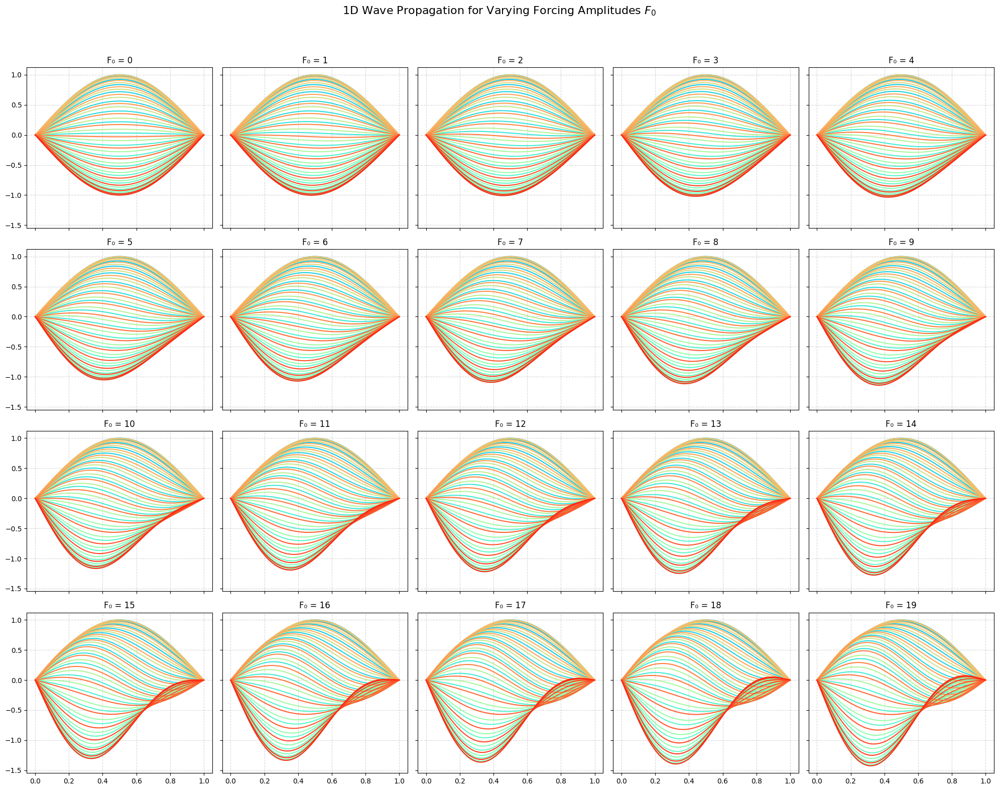

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix

# Spatial domain
n = 100
x = np.linspace(0, 1, n)
dx = x[1] - x[0]

# Time domain
dt = 0.0025
t_max = 1.5
timesteps = int(t_max / dt)

# Mass matrices and wave speed
c = 1.0
I = np.eye(n)
L = (np.diag(np.ones(n-1), -1) - 2 * np.eye(n) + np.diag(np.ones(n-1), 1)) / dx**2
L[0, :] = L[-1, :] = 0  # Dirichlet BCs

# System matrices (semi-implicit integration)
M1 = np.block([[I, -dt * I], [-dt * c**2 * L, I]])
M2 = np.block([[I, dt * I], [dt * c**2 * L, I]])
M1 = csr_matrix(M1)

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Forcing amplitudes
F0_values = np.arange(20)

# Select snapshot indices
number = 50#16
snapshot_indices = np.linspace(0, timesteps - 1, number, dtype=int)
snapshot_set = set(snapshot_indices)
snapshot_times = snapshot_indices * dt

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, number))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Set up figure
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.flatten()

for idx, F_0 in enumerate(F0_values):
    U = np.concatenate([u0, v0])
    U_snapshots = []

    for step in range(timesteps):
        t = step * dt
        g = F_0 * np.sin(2 * np.pi * x) * np.cos(2 * np.pi * t)
        forcing = np.concatenate([np.zeros(n), g])

        rhs = M2 @ U + dt * forcing
        U = spsolve(M1, rhs)

        # Enforce Dirichlet BCs on displacement (u only)
        U[0] = 0
        U[n - 1] = 0

        if step in snapshot_set:
            U_snapshots.append(U[:n].copy())

    # Plot all snapshots
    ax = axes[idx]
    for snap, t_val in zip(U_snapshots, snapshot_times):
        ax.plot(x, snap, label=f't = {t_val:.2f} s')
    ax.set_title(f'F₀ = {F_0}')
    ax.grid(True, linestyle='--', alpha=0.5)
    # if idx == 0:
    #     ax.legend()

fig.suptitle("1D Wave Propagation for Varying Forcing Amplitudes $F_0$", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

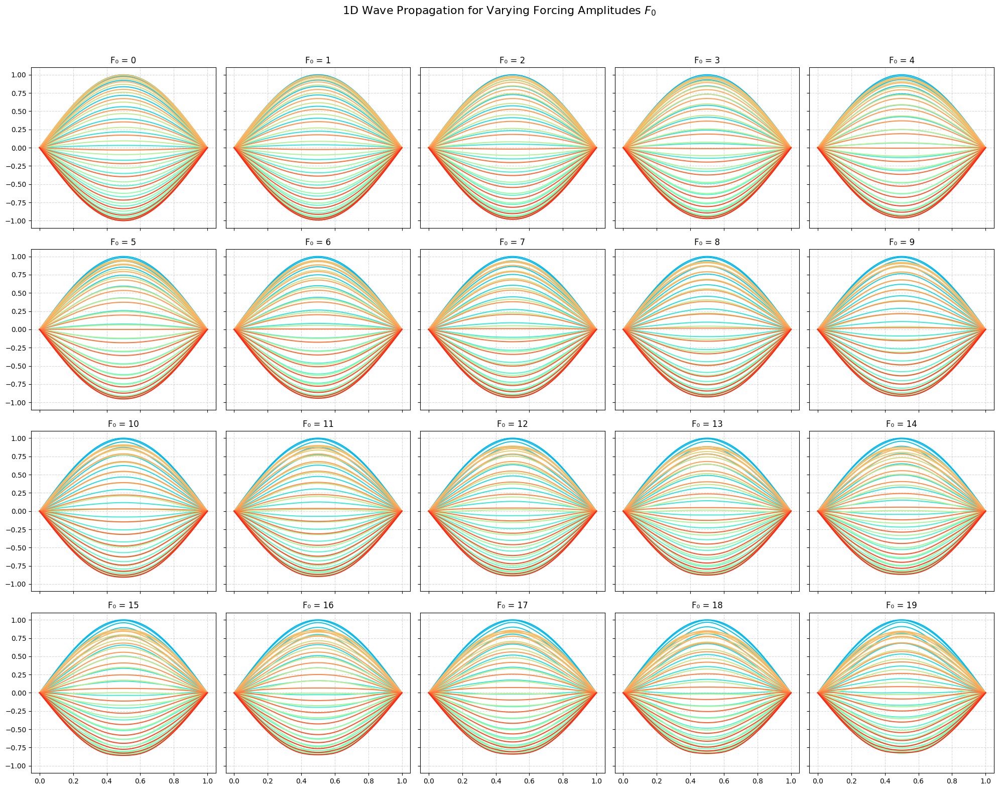

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix

# Spatial domain
n = 100
x = np.linspace(0, 1, n)
dx = x[1] - x[0]

# Time domain
dt = 0.0025
t_max = 1.5
timesteps = int(t_max / dt)

# Mass matrices and wave speed
c = 1.0
I = np.eye(n)
L = (np.diag(np.ones(n-1), -1) - 2 * np.eye(n) + np.diag(np.ones(n-1), 1)) / dx**2
L[0, :] = L[-1, :] = 0  # Dirichlet BCs

# System matrices (semi-implicit integration)
M1 = np.block([[I, -dt * I], [-dt * c**2 * L, I]])
M2 = np.block([[I, dt * I], [dt * c**2 * L, I]])
M1 = csr_matrix(M1)

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Forcing amplitudes
F0_values = np.arange(20)

# Select snapshot indices
number = 50
snapshot_indices = np.linspace(0, timesteps - 1, number, dtype=int)
snapshot_set = set(snapshot_indices)
snapshot_times = snapshot_indices * dt

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, number))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Set up figure
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.flatten()

for idx, F_0 in enumerate(F0_values):
    U = np.concatenate([u0, v0])
    U_snapshots = []

    for step in range(timesteps):
        t = step * dt
        pulse_center = 0.5
        pulse_width = 0.05
        g = F_0 * np.exp(-((x - pulse_center)**2) / (2 * pulse_width**2)) * np.exp(-5 * t)
        forcing = np.concatenate([np.zeros(n), g])

        rhs = M2 @ U + dt * forcing
        U = spsolve(M1, rhs)

        # Enforce Dirichlet BCs on displacement (u only)
        U[0] = 0
        U[n - 1] = 0

        if step in snapshot_set:
            U_snapshots.append(U[:n].copy())

    # Plot all snapshots
    ax = axes[idx]
    for snap, t_val in zip(U_snapshots, snapshot_times):
        ax.plot(x, snap, label=f't = {t_val:.2f} s')
    ax.set_title(f'F₀ = {F_0}')
    ax.grid(True, linestyle='--', alpha=0.5)
    # if idx == 0:
    #     ax.legend()

fig.suptitle("1D Wave Propagation for Varying Forcing Amplitudes $F_0$", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

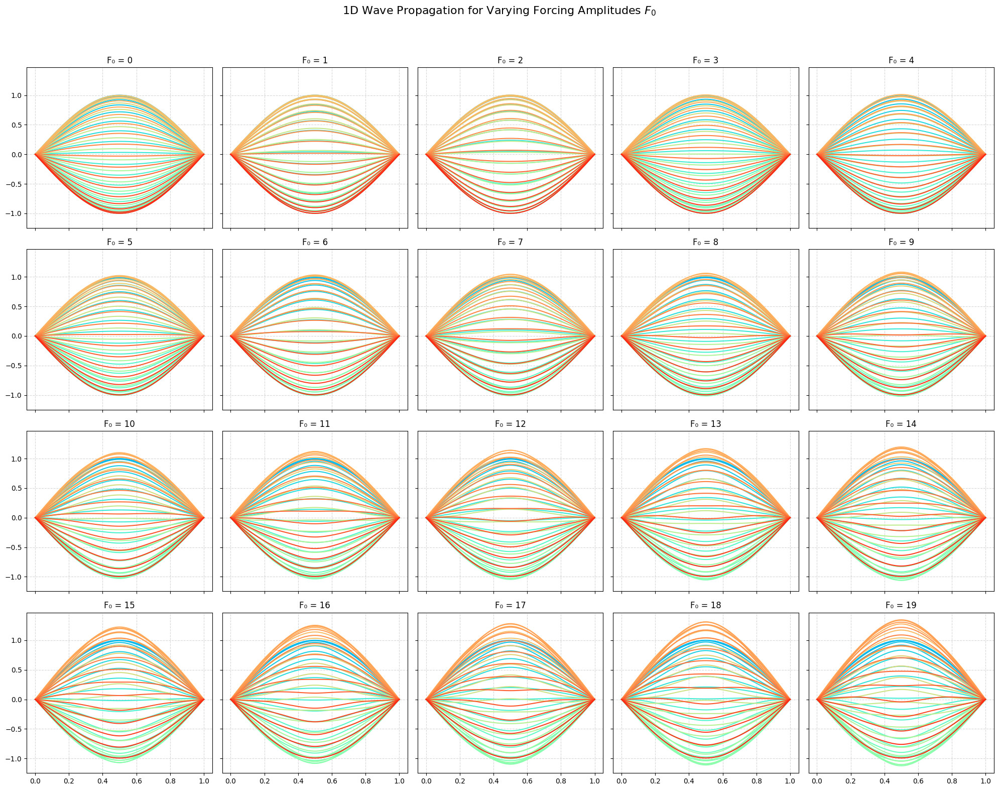

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix

# Spatial domain
n = 100
x = np.linspace(0, 1, n)
dx = x[1] - x[0]

# Time domain
dt = 0.0025
t_max = 1.5
timesteps = int(t_max / dt)

# Mass matrices and wave speed
c = 1.0
I = np.eye(n)
L = (np.diag(np.ones(n-1), -1) - 2 * np.eye(n) + np.diag(np.ones(n-1), 1)) / dx**2
L[0, :] = L[-1, :] = 0  # Dirichlet BCs

# System matrices (semi-implicit integration)
M1 = np.block([[I, -dt * I], [-dt * c**2 * L, I]])
M2 = np.block([[I, dt * I], [dt * c**2 * L, I]])
M1 = csr_matrix(M1)

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Forcing amplitudes
F0_values = np.arange(20)

# Select snapshot indices
number = 50
snapshot_indices = np.linspace(0, timesteps - 1, number, dtype=int)
snapshot_set = set(snapshot_indices)
snapshot_times = snapshot_indices * dt

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, number))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Set up figure
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.flatten()

for idx, F_0 in enumerate(F0_values):
    U = np.concatenate([u0, v0])
    U_snapshots = []

    for step in range(timesteps):
        t = step * dt
        pulse_center = 0.5
        pulse_width = 0.05
        g = F_0 * np.exp(-((x - pulse_center)**2) / (2 * pulse_width**2)) * np.cos(2 * np.pi * t)
        forcing = np.concatenate([np.zeros(n), g])

        rhs = M2 @ U + dt * forcing
        U = spsolve(M1, rhs)

        # Enforce Dirichlet BCs on displacement (u only)
        U[0] = 0
        U[n - 1] = 0

        if step in snapshot_set:
            U_snapshots.append(U[:n].copy())

    # Plot all snapshots
    ax = axes[idx]
    for snap, t_val in zip(U_snapshots, snapshot_times):
        ax.plot(x, snap, label=f't = {t_val:.2f} s')
    ax.set_title(f'F₀ = {F_0}')
    ax.grid(True, linestyle='--', alpha=0.5)
    # if idx == 0:
    #     ax.legend()

fig.suptitle("1D Wave Propagation for Varying Forcing Amplitudes $F_0$", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

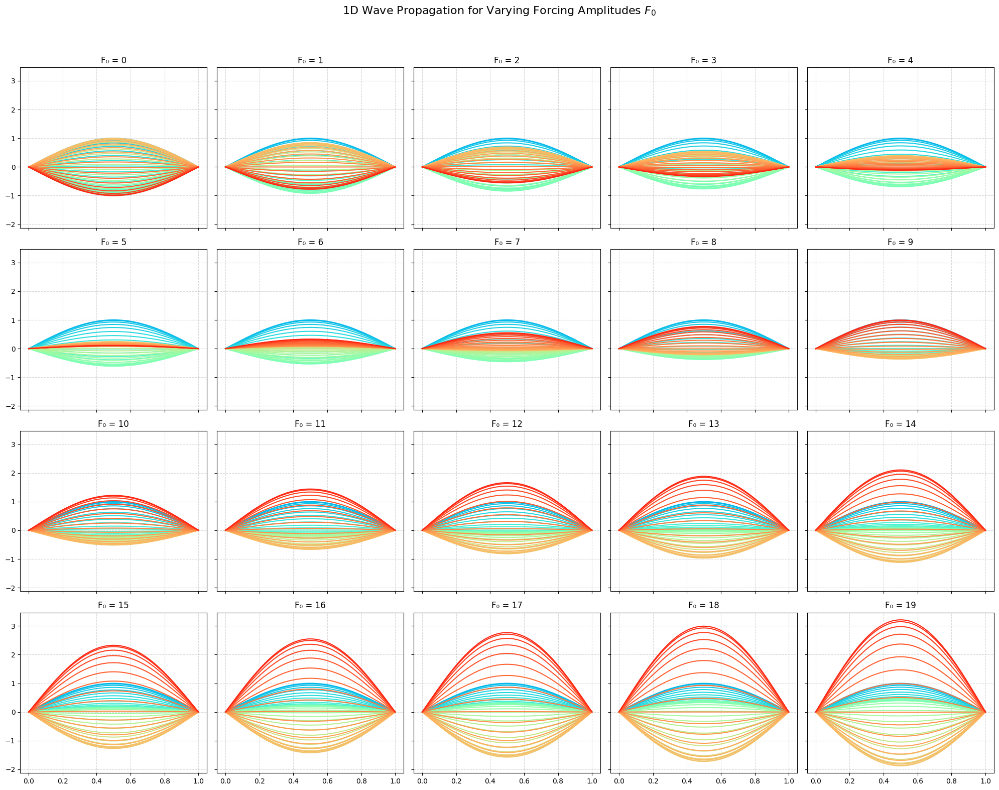

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix

# Spatial domain
n = 100
x = np.linspace(0, 1, n)
dx = x[1] - x[0]

# Time domain
dt = 0.0025
t_max = 1.5
timesteps = int(t_max / dt)

# Mass matrices and wave speed
c = 1.0
I = np.eye(n)
L = (np.diag(np.ones(n-1), -1) - 2 * np.eye(n) + np.diag(np.ones(n-1), 1)) / dx**2
L[0, :] = L[-1, :] = 0  # Dirichlet BCs

# System matrices (semi-implicit integration)
M1 = np.block([[I, -dt * I], [-dt * c**2 * L, I]])
M2 = np.block([[I, dt * I], [dt * c**2 * L, I]])
M1 = csr_matrix(M1)

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Forcing amplitudes
F0_values = np.arange(20)

# Select snapshot indices
number = 50
snapshot_indices = np.linspace(0, timesteps - 1, number, dtype=int)
snapshot_set = set(snapshot_indices)
snapshot_times = snapshot_indices * dt

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, number))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Set up figure
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.flatten()

for idx, F_0 in enumerate(F0_values):
    U = np.concatenate([u0, v0])
    U_snapshots = []

    for step in range(timesteps):
        t = step * dt
        damping_factor = 0.1  # Controls how fast the oscillations decay
        frequency = 1.0  # Frequency of the oscillation
        g = F_0 * np.exp(-damping_factor * t) * np.sin(2 * np.pi * frequency * t) * np.sin(np.pi * x)
        forcing = np.concatenate([np.zeros(n), g])

        rhs = M2 @ U + dt * forcing
        U = spsolve(M1, rhs)

        # Enforce Dirichlet BCs on displacement (u only)
        U[0] = 0
        U[n - 1] = 0

        if step in snapshot_set:
            U_snapshots.append(U[:n].copy())

    # Plot all snapshots
    ax = axes[idx]
    for snap, t_val in zip(U_snapshots, snapshot_times):
        ax.plot(x, snap, label=f't = {t_val:.2f} s')
    ax.set_title(f'F₀ = {F_0}')
    ax.grid(True, linestyle='--', alpha=0.5)
    #if idx == 0:
        #ax.legend()

fig.suptitle("1D Wave Propagation for Varying Forcing Amplitudes $F_0$", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

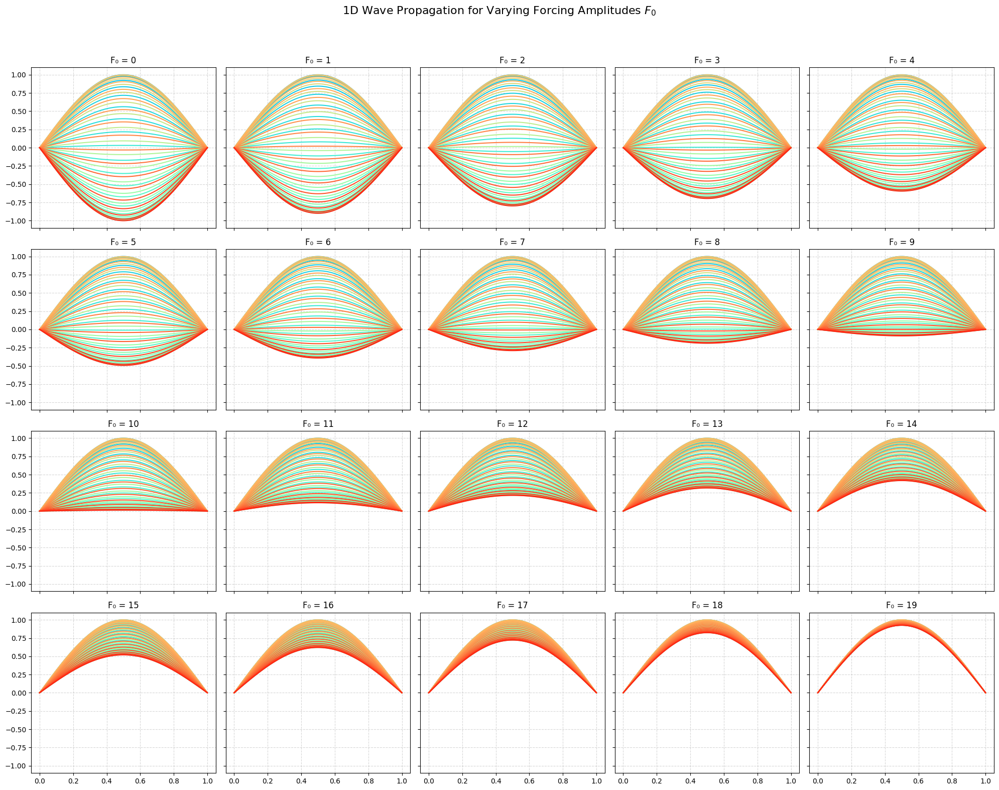

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse.linalg import spsolve
from scipy.sparse import csr_matrix

# Spatial domain
n = 100
x = np.linspace(0, 1, n)
dx = x[1] - x[0]

# Time domain
dt = 0.0025
t_max = 1.5
timesteps = int(t_max / dt)

# Mass matrices and wave speed
c = 1.0
I = np.eye(n)
L = (np.diag(np.ones(n-1), -1) - 2 * np.eye(n) + np.diag(np.ones(n-1), 1)) / dx**2
L[0, :] = L[-1, :] = 0  # Dirichlet BCs

# System matrices (semi-implicit integration)
M1 = np.block([[I, -dt * I], [-dt * c**2 * L, I]])
M2 = np.block([[I, dt * I], [dt * c**2 * L, I]])
M1 = csr_matrix(M1)

# Initial conditions
u0 = np.sin(np.pi * x)
v0 = np.zeros_like(x)

# Forcing amplitudes
F0_values = np.arange(20)

# Select snapshot indices
number = 50
snapshot_indices = np.linspace(0, timesteps - 1, number, dtype=int)
snapshot_set = set(snapshot_indices)
snapshot_times = snapshot_indices * dt

# change plot colors
colors = plt.cm.rainbow(np.linspace(0.25, 0.95, number))
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=colors)

# Set up figure
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=True, sharey=True)
axes = axes.flatten()

for idx, F_0 in enumerate(F0_values):
    U = np.concatenate([u0, v0])
    U_snapshots = []

    for step in range(timesteps):
        t = step * dt
        g = F_0 * np.sin(np.pi * x)
        forcing = np.concatenate([np.zeros(n), g])

        rhs = M2 @ U + dt * forcing
        U = spsolve(M1, rhs)

        # Enforce Dirichlet BCs on displacement (u only)
        U[0] = 0
        U[n - 1] = 0

        if step in snapshot_set:
            U_snapshots.append(U[:n].copy())

    # Plot all snapshots
    ax = axes[idx]
    for snap, t_val in zip(U_snapshots, snapshot_times):
        ax.plot(x, snap, label=f't = {t_val:.2f} s')
    ax.set_title(f'F₀ = {F_0}')
    ax.grid(True, linestyle='--', alpha=0.5)
    #if idx == 0:
        #ax.legend()

fig.suptitle("1D Wave Propagation for Varying Forcing Amplitudes $F_0$", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()